In [1]:
%%html
<style> table { display: inline-block } </style>

# CAB420 Assigment 2 - Basic Funtions and Background

| Name   | Student Number |
| :---   | :--- |
| Charmi Raval       | N10510702          |
| Leonardo Villamil  | N10411526          |
| Litian Chen        | N9646922           |
| Tace Stewart       | N9654411           |

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import sklearn
import os
import csv

from sklearn.model_selection import train_test_split
from pathlib import Path
from IPython.display import clear_output

## Load Data
The provided Database has 3 main files that contain the path/name of the audio files and some metadata (validated.tsv, testing.tsv and training.tsv). Let's check some numbers and class imbalance on these files.

In [3]:
# Path to your 'en' folder as downloaded from https://commonvoice.mozilla.org/en/datasets 
path = '/home/leonardo/Downloads/en/'

validated_data = pd.read_csv (path + 'validated.tsv', sep = '\t')
train_data = pd.read_csv (path + 'train.tsv', sep = '\t')
test_data = pd.read_csv (path + 'test.tsv', sep = '\t')

validated.tsv

Accents on the data base:

nan               275367
us                106263
england            40129
indian             16563
australia          12932
canada             12145
other              10743
scotland            3126
newzealand          2953
african             2943
ireland             2928
hongkong            1112
philippines          920
wales                865
malaysia             634
bermuda              353
singapore            333
southatlandtic       174
Name: accent, dtype: int64


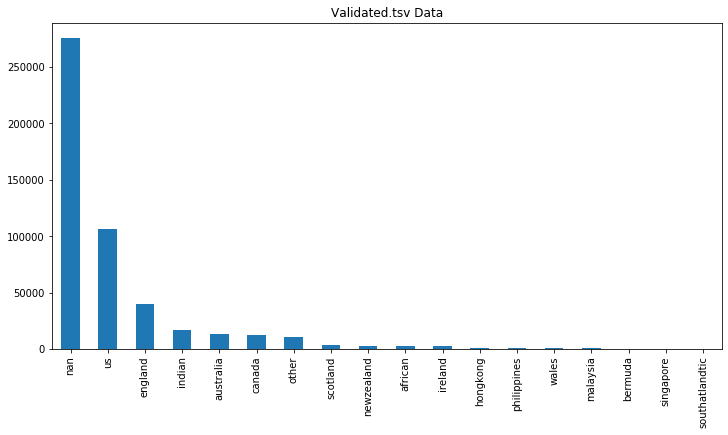

In [4]:
validated_data['accent'] = validated_data['accent'].astype('str')
print('Accents on the data base:\n')
print(validated_data['accent'].value_counts())

fig = plt.figure(figsize=[12, 6])
ax = fig.add_subplot(1, 1, 1)
validated_data['accent'].value_counts().plot(kind='bar')
ax.set_title('Validated.tsv Data');

train.tsv

Accents on the data base:

us             4717
nan            3464
england        1669
australia       972
canada          622
indian          328
other           113
malaysia         82
african          50
newzealand       43
ireland          33
hongkong         20
philippines      14
scotland          5
wales             3
Name: accent, dtype: int64


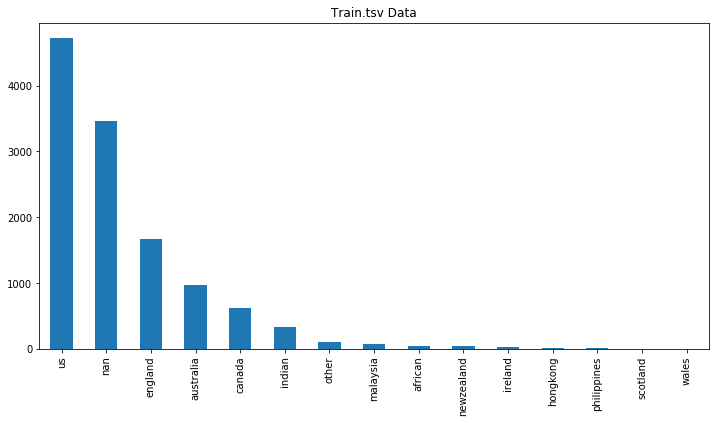

In [5]:
train_data['accent'] = train_data['accent'].astype('str');
print('Accents on the data base:\n')
print(train_data['accent'].value_counts())

fig = plt.figure(figsize=[12, 6])
ax = fig.add_subplot(1, 1, 1)
train_data['accent'].value_counts().plot(kind='bar')
ax.set_title('Train.tsv Data');

test.tsv

Accents on the data base:

nan            6447
us              272
indian          123
england          64
canada           22
other            22
australia        12
scotland         10
african           9
hongkong          6
malaysia          6
bermuda           6
ireland           4
newzealand        4
wales             4
philippines       4
singapore         1
Name: accent, dtype: int64


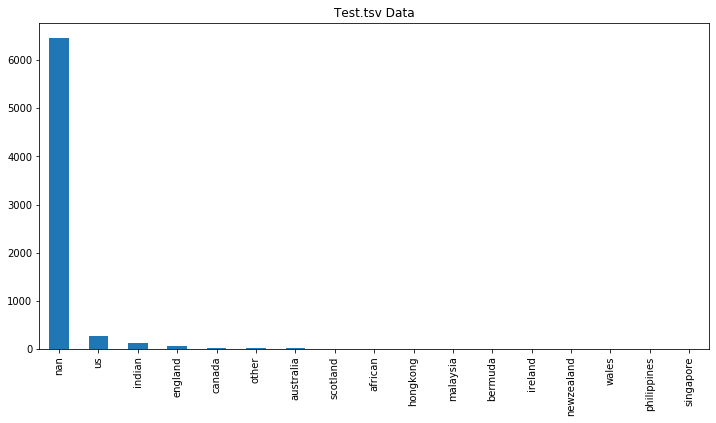

In [6]:
test_data['accent'] = test_data['accent'].astype('str');
print('Accents on the data base:\n')
print(test_data['accent'].value_counts())

fig = plt.figure(figsize=[12, 6])
ax = fig.add_subplot(1, 1, 1)
test_data['accent'].value_counts().plot(kind='bar')
ax.set_title('Test.tsv Data');

Based on these plots, we can select the validated_data as the main database due to the size of it. From here we can remove NaN values and only keep the path/name of the audio files and the accent label. Also we can ramdonly split this data set into training, validation and testing.

In [7]:
# Remove unnecessary columns
columns_to_remove = ['client_id', 'sentence', 'up_votes', 'down_votes', 'age','gender']
validated_data.drop(columns_to_remove, axis=1, inplace=True)

# Remove NaN values
validated_data.replace('nan', np.nan, inplace=True)
validated_data.dropna(axis=0,inplace=True)

# Ramdon sata split: 60% Training - 20% Testing - 20% Validation
X_train_path, X_test_path, y_train, y_test = train_test_split(validated_data['path'], validated_data['accent'], test_size=int(.2*len(validated_data)), random_state=1)

X_train_path, X_val_path, y_train, y_val = train_test_split(X_train_path, y_train, test_size=int(.2*len(validated_data)), random_state=1)


Accents on the training set:

us                63773
england           24195
indian             9919
australia          7682
canada             7182
other              6454
scotland           1899
african            1808
newzealand         1760
ireland            1759
hongkong            669
philippines         552
wales               534
malaysia            370
singapore           205
bermuda             201
southatlandtic      108
Name: accent, dtype: int64

Accents on the validation set:

us                21149
england            7945
indian             3331
australia          2682
canada             2482
other              2197
scotland            627
newzealand          608
ireland             582
african             557
hongkong            219
philippines         182
wales               175
malaysia            130
bermuda              77
singapore            51
southatlandtic       29
Name: accent, dtype: int64

Accents on the testing set:

us                21341
england     

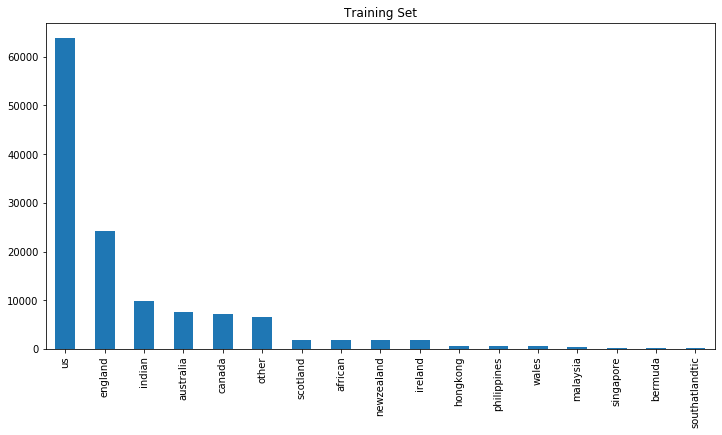

In [8]:
# Check that we have samples for all the classes
print('\nAccents on the training set:\n')
print(y_train.value_counts())
print('\nAccents on the validation set:\n')
print(y_val.value_counts())
print('\nAccents on the testing set:\n')
print(y_test.value_counts())

fig = plt.figure(figsize=[12, 6])
ax = fig.add_subplot(1, 1, 1)
y_train.value_counts().plot(kind='bar')
ax.set_title('Training Set');

In [9]:
# Convert the variables type from Series to ndarray
X_train_path = X_train_path.to_numpy()
X_test_path = X_test_path.to_numpy()
X_val_path = X_val_path.to_numpy()
y_train = y_train.to_numpy()
y_test = y_test.to_numpy()
y_val = y_val.to_numpy()

From here we have created the Training, Validation and Testing data set. Be aware that the data has a clear imbalance wich means that we have to be carefull with the machine learning methods that we propose and try to compensate this imbalance somehow :)

## Using Audio Data in Python

A really good article with examples on how to use audio files and basic machine learning methods : https://www.kdnuggets.com/2020/02/audio-data-analysis-deep-learning-python-part-1.html $ https://www.kdnuggets.com/2020/02/audio-data-analysis-deep-learning-python-part-2.html

/home/leonardo/CAB420-env/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
Samples in file: 80968
/home/leonardo/CAB420-env/lib/python3.8/site-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")
Samples in file: 44100


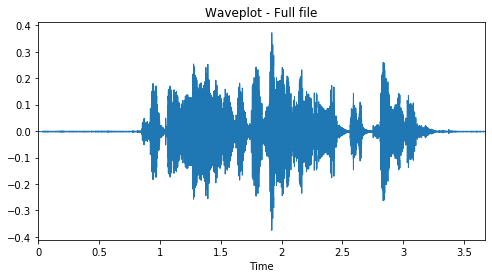

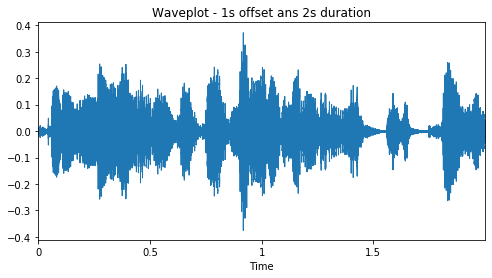

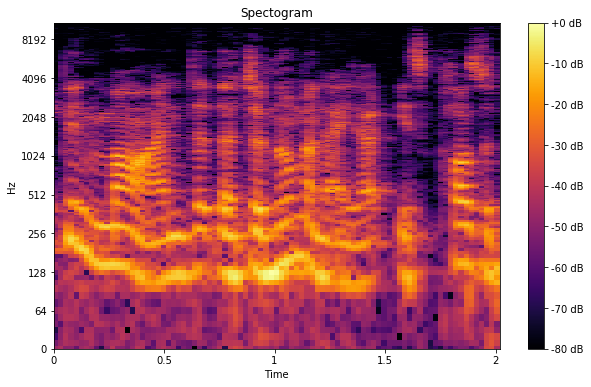

In [10]:
# Load a single audio file
# Here I'm just loading the first 2 sec to normalize the data and have the same number of samples
audio_sample, sr_sample = librosa.load(path + 'clips/' + X_train_path[0] + '.mp3')
print('Samples in file: %d' %len(audio_sample))

# Waveplot 1
fig = plt.figure(figsize=(8, 4))
ax = fig.add_subplot(1, 1, 1)
librosa.display.waveplot(audio_sample, sr=sr_sample)
ax.set_title('Waveplot - Full file')

audio_sample, sr_sample = librosa.load(path + 'clips/' + X_train_path[0] + '.mp3', duration=3)
audio_sample = audio_sample[sr_sample:]
print('Samples in file: %d' %len(audio_sample))

# Waveplot 2
fig = plt.figure(figsize=(8, 4))
ax = fig.add_subplot(1, 1, 1)
librosa.display.waveplot(audio_sample, sr=sr_sample)
ax.set_title('Waveplot - 1s offset ans 2s duration')

# Spectrogram
audio_sample_STFT = librosa.stft(audio_sample)
audio_sample_db = librosa.amplitude_to_db(abs(audio_sample_STFT), ref=np.max)

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(1, 1, 1)
librosa.display.specshow(audio_sample_db, sr=sr_sample, x_axis='time', y_axis='log', cmap='inferno')
plt.colorbar(format='%+2.0f dB')
ax.set_title('Spectogram');

### Feature extraction from Audio signal

#### Spectral centroid
The spectral centroid indicates at which frequency the energy of a spectrum is centered upon or in other words It indicates where the ”center of mass” for a sound is located.

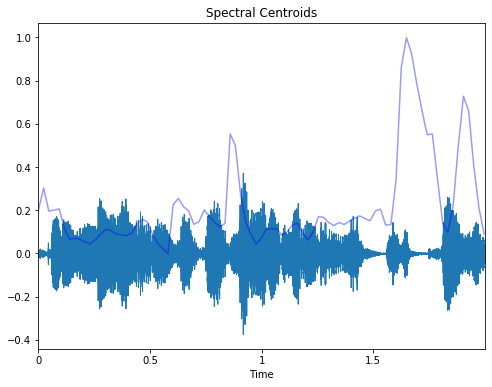

In [11]:
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

spectral_centroids = librosa.feature.spectral_centroid(audio_sample, sr=sr_sample)[0]

# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

#Plotting the Spectral Centroid along the waveform
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1)
librosa.display.waveplot(audio_sample, sr=sr_sample)
plt.plot(t, normalize(spectral_centroids), color='b',alpha=0.4)
ax.set_title('Spectral Centroids');

#### Spectral rolloff
It is a measure of the shape of the signal. It represents the frequency at which high frequencies decline to 0.

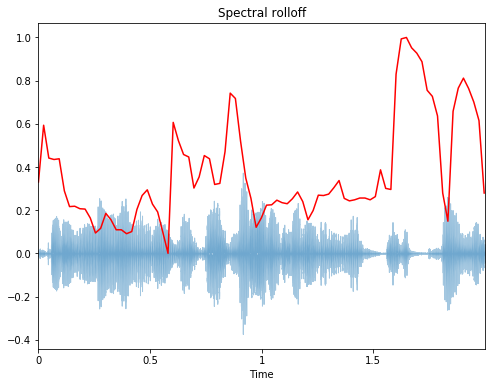

In [12]:
spectral_rolloff = librosa.feature.spectral_rolloff(audio_sample, sr=sr_sample)[0]

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1)
librosa.display.waveplot(audio_sample, sr=sr_sample, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')
ax.set_title('Spectral rolloff');

#### Spectral bandwidth
The spectral bandwidth is defined as the width of the band of light at one-half the peak maximum (or full width at half maximum FWHM) and is represented by the two vertical red lines and λSB on the wavelength axis.

<img src="https://miro.medium.com/max/515/1*oUtYY0-j6iEc78Dew3d0uA.png">


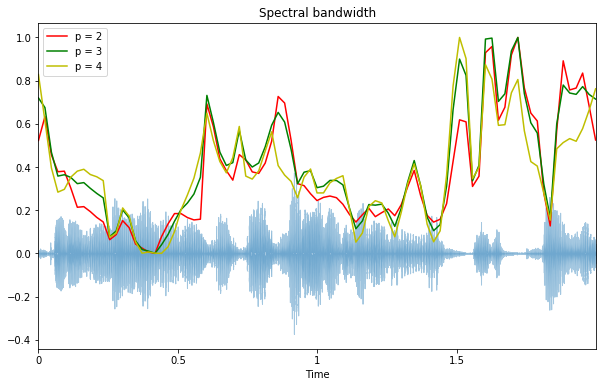

In [13]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(audio_sample, sr=sr_sample)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(audio_sample, sr=sr_sample, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(audio_sample, sr=sr_sample, p=4)[0]

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(1, 1, 1)
librosa.display.waveplot(audio_sample, sr=sr_sample, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'))
ax.set_title('Spectral bandwidth');

#### Zero-Crossing Rate
Calculate the number of zero-crossing within a segment of that signal.

In [14]:
zero_crossings = librosa.zero_crossings(audio_sample, pad=False)
print('Number of zero-crossings: %d' %sum(zero_crossings))

Number of zero-crossings: 3911


#### Mel-Frequency Cepstral Coefficients(MFCCs)
The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.

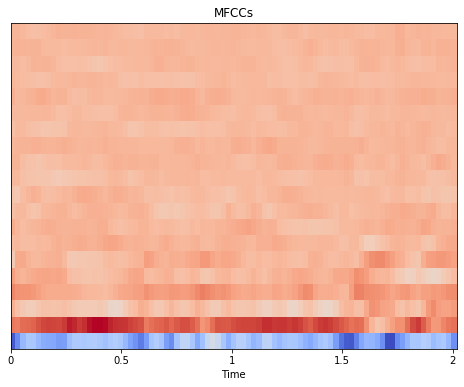

In [15]:
mfccs = librosa.feature.mfcc(audio_sample, sr=sr_sample)

#Displaying  the MFCCs:
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1)
librosa.display.specshow(mfccs, sr=sr_sample, x_axis='time')
ax.set_title('MFCCs');

#### Chroma feature
A chroma feature or vector is typically a 12-element feature vector indicating how much energy of each pitch class, {C, C#, D, D#, E, …, B}, is present in the signal.

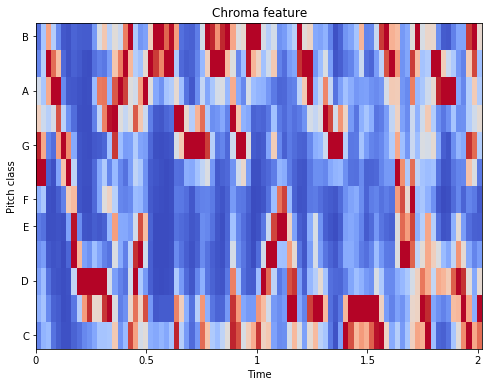

In [16]:
chromagram = librosa.feature.chroma_stft(audio_sample, sr=sr_sample)

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(1, 1, 1)
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', cmap='coolwarm')
ax.set_title('Chroma feature');

## Convert Audio Files into Spectogram Images

In [17]:
# I have disable this part of the code because it takes ages....
if(False):
    # Create new folder to save the images
    Path(path + 'spectrograms').mkdir(parents=True, exist_ok=True)

    cmap = plt.get_cmap('inferno')
    counter = 0;
    total = len(validated_data['path'])

    for filename in validated_data['path']:
        counter += 1
        file_path = path + 'clips/' + filename + '.mp3'
        audio_sample, sr_sample = librosa.load(file_path, mono=True, duration=3)
        clear_output(wait=True)
        print('Saving Images in Progres... %d/%d' %(counter, total))
        
        if len(audio_sample) == (sr_sample*3):
            audio_sample = audio_sample[sr_sample:]
            plt.specgram(audio_sample, NFFT=2048, Fs=2, Fc=0, noverlap=128, cmap=cmap, sides='default', mode='default', scale='dB');
            plt.axis('off');
            plt.savefig(path + 'spectrograms/' + filename +'.png', bbox_inches='tight', pad_inches=0, dpi=80)
            plt.clf()

    print('Saving Images Completed')

Saving Images in Progres... 100/215116
Saving Images Completed


<Figure size 432x288 with 0 Axes>

## Features Extraction into a CV file

In [18]:
header = 'filename rmse spectral_centroid_mean spectral_centroid_std spectral_centroid_median rolloff_mean rolloff_std rolloff_median spectral_bandwidth_mean spectral_bandwidth_std spectral_bandwidth_median zero_crossing_rate_mean zero_crossing_rate_std zero_crossing_rate_median'
for i in range(1, 21):
    header += f' mfcc{i}'
for i in range(1, 13):
    header += f' chroma_stft{i}'
header += ' accent'

header = header.split()

In [19]:
# I have disable this part of the code because it takes ages....
if(False):
    file = open(path + 'dataset.csv', 'w', newline='')
    with file:
        writer = csv.writer(file)
        writer.writerow(header)

    counter = 0;
    total = len(validated_data['path'])

    for filename in validated_data['path']:
        counter += 1
        
        file_path = path + 'clips/' + filename + '.mp3'
        audio_sample, sr_sample = librosa.load(file_path, mono=True, duration=3)
        clear_output(wait=True)
        print('Extracting Features in Progres... %d/%d' %(counter, total))
        
        if len(audio_sample) == (sr_sample*3):
            audio_sample = audio_sample[sr_sample:]
            
            rmse = librosa.feature.rms(y=audio_sample)
            chroma_stft = librosa.feature.chroma_stft(y=audio_sample, sr=sr_sample)
            spec_cent = librosa.feature.spectral_centroid(y=audio_sample, sr=sr_sample)
            spec_bw = librosa.feature.spectral_bandwidth(y=audio_sample, sr=sr_sample)
            rolloff = librosa.feature.spectral_rolloff(y=audio_sample, sr=sr_sample)
            zcr = librosa.feature.zero_crossing_rate(audio_sample)
            mfcc = librosa.feature.mfcc(y=audio_sample, sr=sr_sample)

            to_append = f'{filename} {np.mean(rmse)} {np.mean(spec_cent)} {np.std(spec_cent)} {np.median(spec_cent)} {np.mean(rolloff)} {np.std(rolloff)} {np.median(rolloff)} {np.mean(spec_bw)} {np.std(spec_bw)} {np.median(spec_bw)} {np.mean(zcr)} {np.std(zcr)} {np.median(zcr)}'    
            for e in mfcc:
                to_append += f' {np.mean(e)}'
            for e in chroma_stft:
                to_append += f' {np.mean(e)}'
            to_append += f' ' + str(validated_data['accent'].to_numpy()[counter-1])
            file = open(path + 'dataset.csv', 'a', newline='')
            with file:
                writer = csv.writer(file)
                writer.writerow(to_append.split())

    print('Extraction Completed')

Extracting Features in Progres... 100/215116
Extraction Completed
